# Silhouette

In [1]:
import torch
from torchvision.models import resnet18
from ignite.utils import manual_seed
import pickle

from analyze import *

manual_seed(123)

## Prepare testee samples

In [2]:
with open('materials/samples/sample_ImageNet', 'rb') as f:
    sample = pickle.load(f)

print(f'sample batch')
# visualize_images(sample['batch']['images'],
#                  sample['batch']['tags'],
#                  sample['batch']['used_normalization'],
#                  sample['batch']['classes'])

model = resnet18(pretrained=True)

def prepare_testee_samples(model, batch):
    testee_samples = {}
    
    def extract_feature_map(location):
        def hook(m, i, o):
            testee_samples[location] = o.detach()
        return hook
    
    handle1 = model.relu.register_forward_hook(extract_feature_map('before_layer1'))
    handle2 = model.layer1.register_forward_hook(extract_feature_map('between_layer1_and_layer2'))
    
    model(batch)
    
    handle1.remove()
    handle2.remove()
    
    return testee_samples
    
feature_maps = prepare_testee_samples(model, sample['batch']['images'])

print(f'feature map before layer1: {feature_maps["before_layer1"].size()}')
print(f'feature map between layer1 and layer2: {feature_maps["between_layer1_and_layer2"].size()}')

sample batch
feature map before layer1: torch.Size([16, 64, 112, 112])
feature map between layer1 and layer2: torch.Size([16, 64, 56, 56])


## Components

### SilhouetteConv2d

**SilhouetteConv2d test**
simiulate layer1.0.conv1: threshold: 0.2, in_channels: 64, out_channels: 128, options: weight_scaling(X), interpolate before sectioning(X)


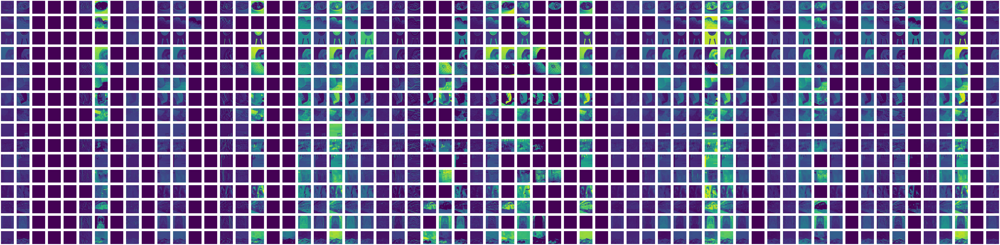

In [3]:
from architectures.Silhouette.components_Silhouette import SilhouetteConv2d

def test_SilhouetteConv2d():
    print(f'**SilhouetteConv2d test**')
    
    in_channels = 64
    out_channels = 128
    threshold = 0.2
    
    print(f'simiulate layer1.0.conv1: threshold: {threshold}, in_channels: {in_channels}, out_channels: {out_channels}, options: weight_scaling(X), interpolate before sectioning(X)')
    layer = SilhouetteConv2d(in_channels, out_channels)
        
    y, masked_x = layer(feature_maps['before_layer1'], debug=True)
    visualize_tensor(masked_x)
#     visualize_tensor_distribution(feature_maps['before_layer1'])
#     visualize_tensor_distribution(y)
    
test_SilhouetteConv2d()

## Models

### ResNet

In [4]:
from brevitas.nn import QuantConv2d
from architectures.common.components_common import *
from architectures.Silhouette.components_Silhouette import *
from architectures.Silhouette.models.resnet_Silhouette import resnet18_Silhouette

In [5]:
target_dataset = "ImageNet"
num_classes = 1000

model_config = {
    "backbone": "resnet18",
    "variation": "Silhouette",
    "config": {
        "layers": {
            "layer1": {
                "threshold": 0.2,
                "weight_bit_width": 8,
                "activation_bit_width": 8,
                "weight_scaling_per_output_channel": True,
                "interpolate_before_sectioning": True
            },
            "layer2": {
                "threshold": 0.1,
                "weight_bit_width": 8,
                "activation_bit_width": 8,
                "weight_scaling_per_output_channel": True,
                "interpolate_before_sectioning": True
            },
            "layer3": {
                "threshold": 0.2,
                "weight_bit_width": 4,
                "activation_bit_width": 4,
                "weight_scaling_per_output_channel": True,
                "interpolate_before_sectioning": True
            },
            "layer4": {
                "threshold": 0.25,
                "weight_bit_width": 2,
                "activation_bit_width": 8,
                "weight_scaling_per_output_channel": True,
                "interpolate_before_sectioning": True
            }
        }
    }
}
model = resnet18_Silhouette(target_dataset, model_config['config'])

#### Verify Silhouette model has well-made by configuration

In [6]:
def print_model(model):
    for name, m in model.named_modules():
        if type(m) == SilhouetteConv2d:
            print(f'{name}: SilhouetteConv2d({m.threshold})')
        elif type(m) == QuantConv2d and not 'conv_layers' in name:
            print(f'{name}: QuantConv2d({m.quant_weight().bit_width})')
        elif type(m) == QuantConv2d:
            print(f'    ㄴ{name}: QuantConv2d({m.quant_weight().bit_width})')
        elif type(m) == QuantPACTReLU:
            print(f'{name}: QuantPACTReLU({m.quant_act_bit_width().item()})')
        
            
print_model(model)

input_stem.2: QuantPACTReLU(8.0)
layer1.0.conv1: SilhouetteConv2d(0.20000000298023224)
layer1.0.conv1.conv_layer: QuantConv2d(8.0)
layer1.0.relu1: QuantPACTReLU(8.0)
layer1.0.conv2: SilhouetteConv2d(0.20000000298023224)
layer1.0.conv2.conv_layer: QuantConv2d(8.0)
layer1.0.relu2: QuantPACTReLU(8.0)
layer1.1.conv1: SilhouetteConv2d(0.20000000298023224)
layer1.1.conv1.conv_layer: QuantConv2d(8.0)
layer1.1.relu1: QuantPACTReLU(8.0)
layer1.1.conv2: SilhouetteConv2d(0.20000000298023224)
layer1.1.conv2.conv_layer: QuantConv2d(8.0)
layer1.1.relu2: QuantPACTReLU(8.0)
layer2.0.conv1: SilhouetteConv2d(0.10000000149011612)
layer2.0.conv1.conv_layer: QuantConv2d(8.0)
layer2.0.relu1: QuantPACTReLU(8.0)
layer2.0.conv2: SilhouetteConv2d(0.10000000149011612)
layer2.0.conv2.conv_layer: QuantConv2d(8.0)
layer2.0.shortcut.0: SilhouetteConv2d(0.10000000149011612)
layer2.0.shortcut.0.conv_layer: QuantConv2d(8.0)
layer2.0.relu2: QuantPACTReLU(8.0)
layer2.1.conv1: SilhouetteConv2d(0.10000000149011612)
layer2.

In [7]:
y = model(sample['batch']['images'])
print(y.shape)

torch.Size([16, 1000])
